# Running SCICoNE on 10x Genomics data
In this notebook we apply SCICoNE to the 10x Genomics data set from section E of a frozen breast tumor tissue from a triple negative ductal carcinoma with an estimated tumor purity of 75%, which is available [here](https://support.10xgenomics.com/single-cell-dna/datasets/1.1.0/breast_tissue_A_2k). The raw data contain 2053 cells and 154794 genomic bins. To reduce the runtime, here we will aggregate the 20kbp-sized bins to 200kbp, use 100 cells to identify breakpoints and learn a tree on clustered data. We showcase the possibility of changing the root state to model whole-genome duplications. Running the notebook (except the data download) takes about 60 minutes on a common laptop.

Note: we recommend you to go through the [SCICoNE tutorial](https://github.com/cbg-ethz/SCICoNE/blob/master/notebooks/tutorial.ipynb) before running this notebook.

First we download the data.

In [1]:
!wget http://cf.10xgenomics.com/samples/cell-dna/1.1.0/breast_tissue_E_2k/breast_tissue_E_2k_cnv_data.h5

--2021-03-18 01:46:38--  http://cf.10xgenomics.com/samples/cell-dna/1.1.0/breast_tissue_E_2k/breast_tissue_E_2k_cnv_data.h5
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://cf.10xgenomics.com/samples/cell-dna/1.1.0/breast_tissue_E_2k/breast_tissue_E_2k_cnv_data.h5 [following]
--2021-03-18 01:46:38--  https://cf.10xgenomics.com/samples/cell-dna/1.1.0/breast_tissue_E_2k/breast_tissue_E_2k_cnv_data.h5
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2617101290 (2.4G) [binary/octet-stream]
Saving to: ‘breast_tissue_E_2k_cnv_data.h5.1’

100%[====================================>] 2,617,101,290 67.2MB/s   in 38s    

2021-03-18 01:47:16 (65.5 MB/s) - ‘breast_tissue_E_2k_cnv_data.h5.1

Import `scicone` and create the SCICoNE object.

In [2]:
import scicone
import numpy as np

install_path = '../build/'
temporary_outpath = './'
seed = 42 # for reproducibility

np.random.seed(seed)

# Create SCICoNE object
sci = scicone.SCICoNE(install_path, temporary_outpath, verbose=False)

Using binaries at ../build/


SCICoNE's API is prepared to handle the format from the standard `cnv_data.h5` file produced by the 10x Genomics CNV pipeline. We use the function `read_10x` to extract the GC bias-corrected read counts, the unmappable bins and the chromosome stop bins to build the cells by bins matrix required by SCICoNE, and store everything at `SCICoNE.data`. We set `downsampling_factor=10` to aggregate the 20kbp-sized bins into 200kbp.

In [3]:
# will take a few minutes (2-5mins)
sci.read_10x('breast_tissue_E_2k_cnv_data.h5', downsampling_factor=10)

Let's normalize the cells by their total read counts and plot the data.

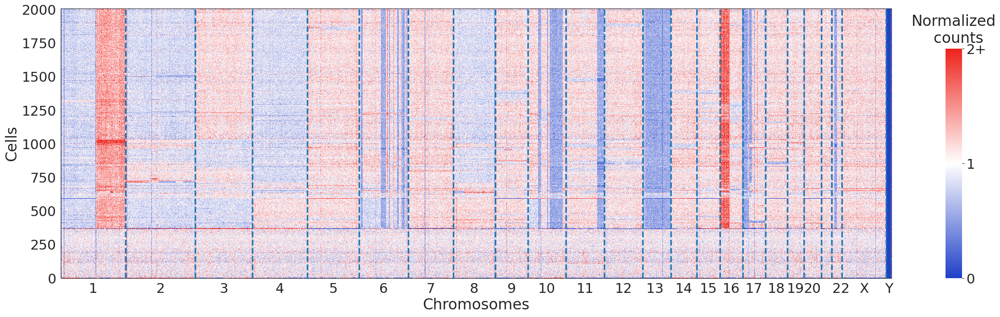

In [4]:
normalized_counts = sci.data['filtered_counts'] / np.sum(np.abs(sci.data['filtered_counts']), axis=1).reshape(-1, 1)
normalized_counts *= normalized_counts.shape[1]

scicone.plotting.plot_matrix(normalized_counts, cbar_title='Normalized\n  counts',
                            chr_stops_dict=sci.data['filtered_chromosome_stops'], vmax=2,
                            cluster=True)

The first step is to find the breakpoints that define copy number regions. Because we assume breakpoints define copy number regions which are shared across cells, at this stage we use a random subset of 100 cells instead of the full batch. We pass the chromosome coordinates as known regions.

In [5]:
# Take cells randomly
cell_subset = np.random.choice(2000, size=100, replace=False)

In [6]:
# Will take about 20 mins
bps = sci.detect_breakpoints(data=sci.data['filtered_counts'][cell_subset], verbosity=1,
                            input_breakpoints=list(sci.data['filtered_chromosome_stops'].values()),
                            window_size=50)

Mapping to genes...
Done.


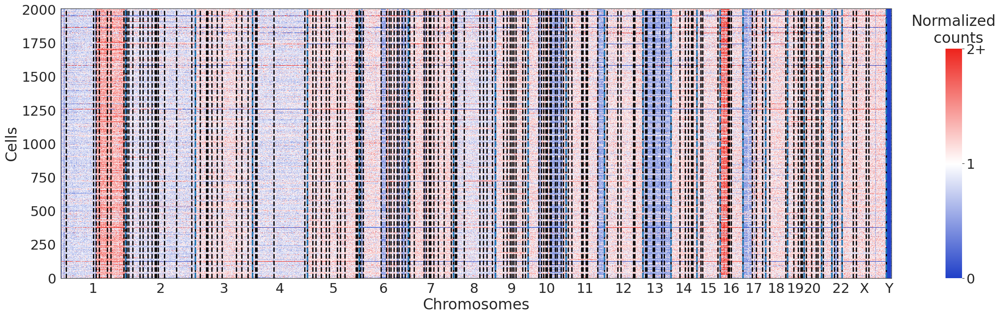

In [7]:
scicone.plotting.plot_matrix(normalized_counts, bps=bps['segmented_regions'],
                             chr_stops_dict=sci.data['filtered_chromosome_stops'],
                             cbar_title='Normalized\n  counts', vmax=2)

Instead of assuming the copy number neutral state is 2 for all chromosomes, we will use the `region_neutral_states` argument of `learn_trees` to adjust the root of the copy number aberration tree. In this case the patient is a female, so we set all chromosomes to have 2 as neutral except chromosome Y, which has 0 copies.

In [8]:
chr_neutral_states = dict(zip(sci.data['filtered_chromosome_stops'].keys(), 
                         [2] * len(sci.data['filtered_chromosome_stops'].keys())))
chr_neutral_states['Y'] = 0

region_neutral_states = scicone.utils.set_region_neutral_states(sci.bps['segmented_regions'], 
                                                                 list(sci.data['filtered_chromosome_stops'].values()), 
                                                                 list(chr_neutral_states.values()))

We are now ready to jointly call copy number states and reconstruct the event history tree.

In [9]:
diploid_tree = sci.learn_tree(region_neutral_states=region_neutral_states, 
                              cluster_tree_n_iters=40000,
                              cluster=True, full=False, n_reps=10, max_tries=4,
                              copy_number_limit=4, seed=seed)

Condensing regions...
Done.
Learning cluster tree...
n_neighbours to be used: 200
Setting min_cluster_size to 1
Finding 200 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.12892770767211914 seconds
Jaccard graph constructed in 16.181888103485107 seconds
Wrote graph to binary file in 0.32626938819885254 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.623758
Louvain completed 21 runs in 3.1346704959869385 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 21.101470470428467 seconds
Found 4 clusters.
Cluster sizes: [1028.  390.  323.  267.]
Cluster tree finished with a robustness score of 1.0 after 1 tries


The `plot_tree` function can be used to visualize the reconstructed tree. By default, the node labels indicate the affected regions. Setting `gene_labels=True` shows the affected genes from COSMIC's Cancer Gene Census instead (which can be filtered by using the `tumor_type` argument), and adds the total number of regions amplified and deleted at each node. The number of cells attached to the node can also be shown.

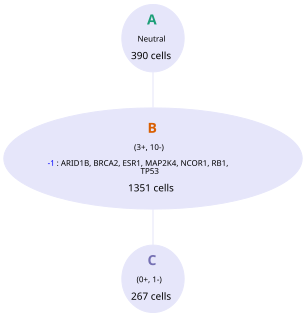

In [10]:
diploid_tree.plot_tree(gene_labels=True, tumor_type='breast',
                       node_labels=True, node_sizes=True, event_fontsize=8, nodesize_fontsize=10)

Let's compare the normalized counts with the inferred copy number profiles. To facilitate the visualization, we group cells based on of their copy number states, and cluster the normalized counts of the cells within each clone.

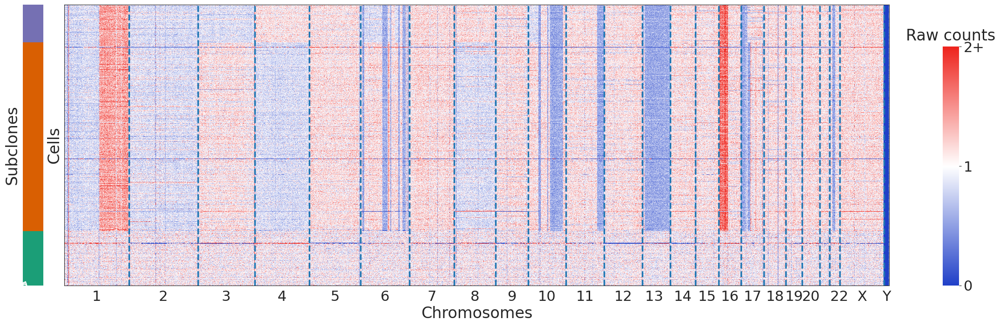

In [13]:
scicone.plotting.plot_matrix(normalized_counts, mode='data', cbar_title='Raw counts', vmax=2,
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=diploid_tree.cell_node_labels)

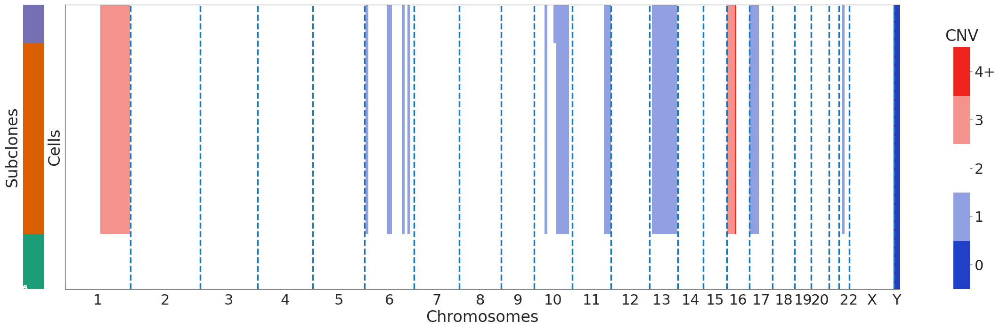

In [14]:
scicone.plotting.plot_matrix(diploid_tree.outputs['inferred_cnvs'], mode='cnv', cbar_title='CNV', vmax=4,
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=diploid_tree.cell_node_labels)

Comparing the two figures, it seems that there are events of small magnitude in clones B and C which are not detected by the CNA tree, which assumes a neutral diploid state. Inspecting the library size distribution across clones, it becomes apparent that cells from clone A have a lower library size than the rest of the sample. Tied with the seemingly constant copy number profile of this clone, this indicates that it is likely to correspond to diploid cells, whereas the others have undergone a whole genome duplication.

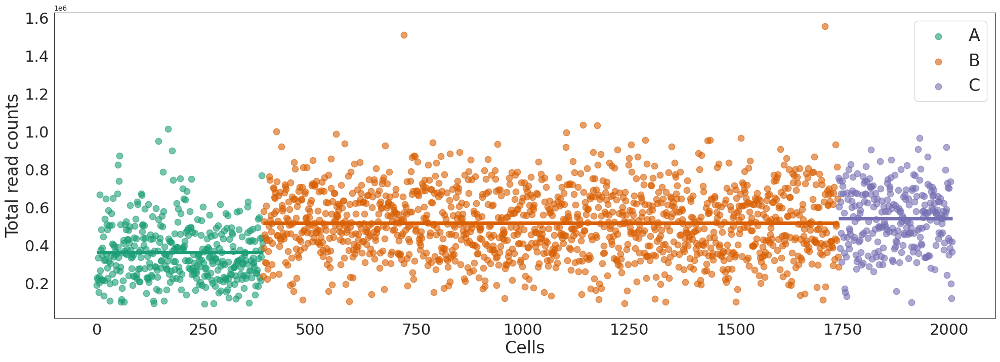

In [15]:
import matplotlib.pyplot as plt
import numpy as np

lib_sizes = np.sum(sci.data['filtered_counts'], axis=1).reshape(-1,1)
# Sort cells by clone for visualization
lib_sizes, labels = scicone.utils.cluster_clones(lib_sizes, diploid_tree.cell_node_labels, within_clone=False)

fig = plt.figure(figsize=(24,8), dpi=100)
for i, label in enumerate(np.unique(labels)):
    xx = np.arange(np.where(label==labels)[0][0], np.where(label==labels)[0][-1]+1)
    plt.scatter(xx, lib_sizes[label==labels], label=label, color=scicone.constants.LABEL_COLORS_DICT[label], 
             s=80, alpha=0.6)
    plt.hlines(np.mean(lib_sizes[label==labels]), xx[0], xx[-1]+1, 
                color=scicone.constants.LABEL_COLORS_DICT[label], linewidth=5, linestyle='-')
plt.legend(fontsize=24)
plt.ylabel('Total read counts',fontsize=24)
plt.xlabel('Cells',fontsize=24)
ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(22)
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(22)
plt.show()

If we suspect that a large-scale event has occurred in all the cells in the sample, such as a whole-genome duplication, it is beneficial for the tree inference that we start with a tetraploid root. We can then compare the score of the two trees, and choose the best one. If the tetraploid root fits the data better, but we trust that cells in A are diploid, we adjust the tree to capture that with the `adjust_to_wgd` function.

In [16]:
wgd_tree = sci.learn_tree(region_neutral_states=region_neutral_states*2, # tetraploid root
                          cluster_tree_n_iters=40000,
                          cluster=True, full=False, n_reps=10, max_tries=4,
                          copy_number_limit=4, seed=seed)

Condensing regions...
Done.
Learning cluster tree...
n_neighbours to be used: 200
Setting min_cluster_size to 1
Finding 200 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.14670753479003906 seconds
Jaccard graph constructed in 16.05328130722046 seconds
Wrote graph to binary file in 0.21074914932250977 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.623757
Louvain completed 21 runs in 4.413872241973877 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 22.792540073394775 seconds
Found 4 clusters.
Cluster sizes: [1027.  390.  324.  267.]
Cluster tree finished with a robustness score of 1.0 after 1 tries


In [17]:
print(wgd_tree.score > diploid_tree.score)

True


We now use the function `adjust_to_wgd` to adapt the tree to have a diploid root, to which we attach the cells from clone A, and a node indicating whole-genome duplication, which serves as the root for the malignant cells.

390/2008 tetraploid cells adjusted to diploid.


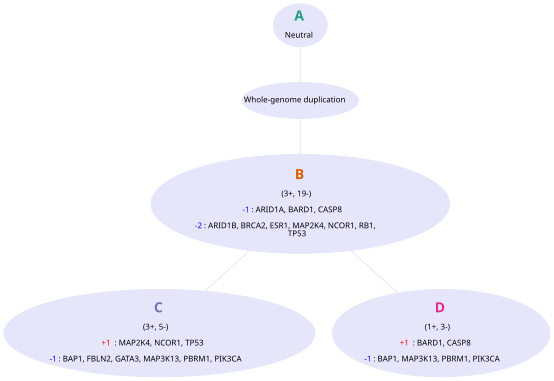

In [18]:
wgd_tree.adjust_to_wgd()
wgd_tree.node_dict['0']['label'] = 'A'
wgd_tree.plot_tree(gene_labels=True, tumor_type='breast',
                   node_labels=True, node_sizes=False, event_fontsize=8, nodesize_fontsize=10)

And we inspect the final CNV profiles.

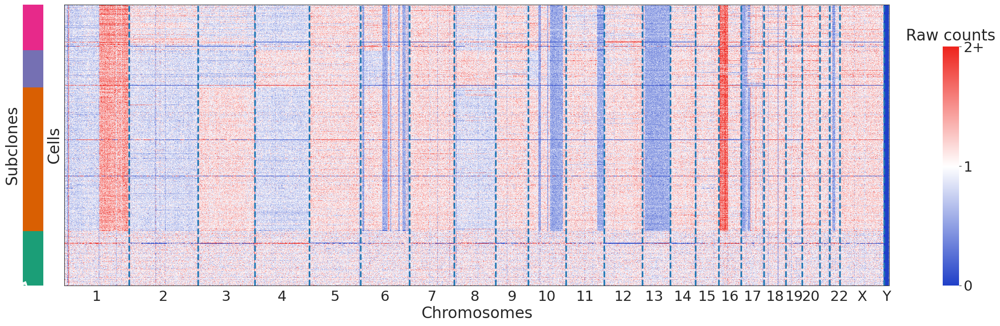

In [19]:
scicone.plotting.plot_matrix(normalized_counts, mode='data', cbar_title='Raw counts', vmax=2,
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=wgd_tree.cell_node_labels)

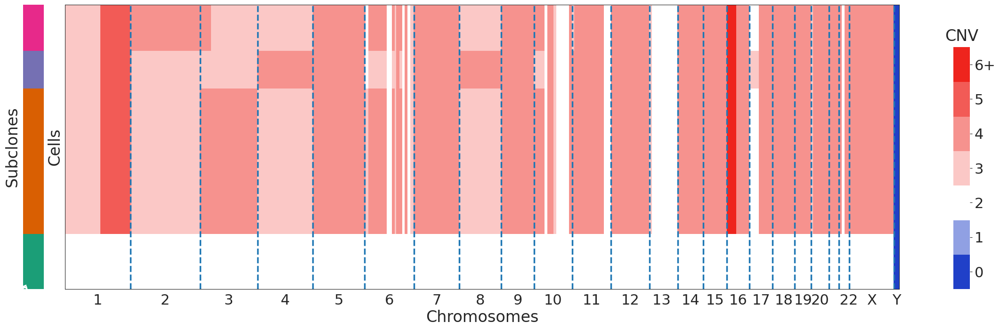

In [20]:
scicone.plotting.plot_matrix(wgd_tree.outputs['inferred_cnvs'], mode='cnv', cbar_title='CNV', vmax=6,
                            chr_stops_dict=sci.data['filtered_chromosome_stops'],
                            labels=wgd_tree.cell_node_labels)

Of course, it is also possible that there was no whole-genome duplication and cells progressively accumulated chromosome-level amplifications. SCICoNE can not distinguish these two settings from the data since there are no cells providing support for such intermediate steps. Nonetheless, whole-genome duplications are known to be common in cancer, so we use that prior knowledge in this analysis.

Additionally, while this tree fits the data better, we note that using the cluster tree still can not provide very detailed cell-level information. If one wishes to gain more resolution (at a higher computational cost), the argument `full` in `learn_tree` must be set to `True`.